In this notebook we comapre k-means clustering on CLIP embeddings of a dataset with k-means clustering on the raw pixel features of the images in the Pattern dataset. <br>
We hypothesize that in the CLIP space, the clusters formed from the CLIP embeddings will represent semantic similarities in the patterns, e.g., patterns that arise in similar materials, similar objects <br>
On the other hand, we expect the clusters formed from the raw pixel vectors to be grouped based on more high-level similarities in the features of the images, e.g., similiarity in the shapes in the pattern no matter the mediums in which the patterns occur, colors, etc. <br> 
(starter code from Dhanashree (Birds dataset) with new code, techniques, and observations written by Megha and Naomi for the Patterns dataset.)

Although we have preserved the Elbow Method code and Silhouette Score code we wrote while experimenting, please note that we ultimately set our best k for both pixel and clip spaces from the number of category subfolders in the dataset as discussed.

In [1]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from PIL import Image
import random

## Clustering of CLIP embeddings

In [2]:
# Load patterns_emb. 
patterns_emb = np.load('patterns_emb.npy')
patterns_emb.shape # shape (1380, 1024)

(1380, 1024)

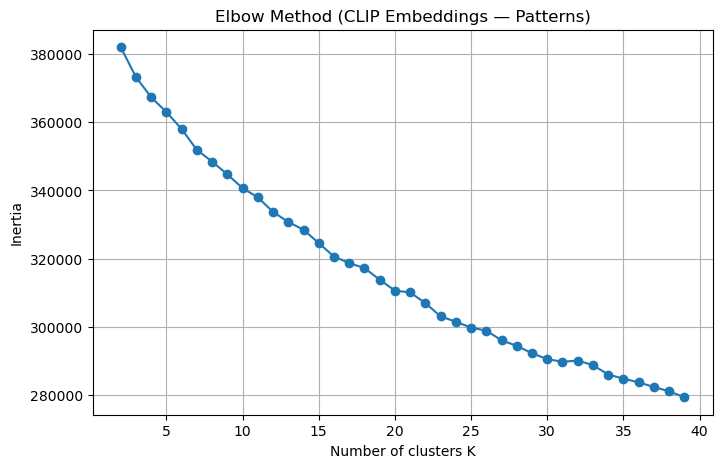

In [3]:
# Plotting Elbow curve to find a god estimate for number of clusters. 
inertias = [] # Sum of squared distances of each data point to its closest cluster center.
K_range = range(2, 40)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(patterns_emb)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K_range, inertias, marker="o")
plt.title("Elbow Method (CLIP Embeddings — Patterns)")
plt.xlabel("Number of clusters K")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

The graph does not show a clear elbow. So we will use another method to determine the best number of clusters, called the Silhouette Score.

## SILHOUETTE SCORE

K=2, silhouette=0.0338
K=3, silhouette=0.0328
K=4, silhouette=0.0279
K=5, silhouette=0.0300
K=6, silhouette=0.0281
K=7, silhouette=0.0302
K=8, silhouette=0.0289
K=9, silhouette=0.0312
K=10, silhouette=0.0340
K=11, silhouette=0.0397
K=12, silhouette=0.0432
K=13, silhouette=0.0447
K=14, silhouette=0.0474
K=15, silhouette=0.0475
K=16, silhouette=0.0488
K=17, silhouette=0.0519
K=18, silhouette=0.0535
K=19, silhouette=0.0564
K=20, silhouette=0.0553
K=21, silhouette=0.0612
K=22, silhouette=0.0623
K=23, silhouette=0.0639
K=24, silhouette=0.0642
K=25, silhouette=0.0625
K=26, silhouette=0.0637
K=27, silhouette=0.0654
K=28, silhouette=0.0664
K=29, silhouette=0.0645
K=30, silhouette=0.0663
K=31, silhouette=0.0706
K=32, silhouette=0.0704
K=33, silhouette=0.0688
K=34, silhouette=0.0698
K=35, silhouette=0.0708
K=36, silhouette=0.0737
K=37, silhouette=0.0708
K=38, silhouette=0.0722
K=39, silhouette=0.0725


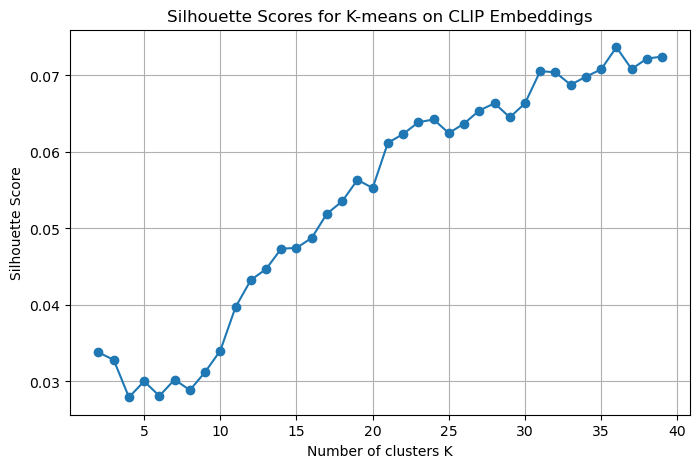


 Best K = 36 with score = 0.0737


In [4]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# embeddings: your (N, D) CLIP embedding matrix
# Ks: the range of cluster numbers
Ks = range(2, 40)
sil_scores = []

for k in Ks:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(patterns_emb)
    score = silhouette_score(patterns_emb, labels)
    sil_scores.append(score)
    print(f"K={k}, silhouette={score:.4f}")

import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(Ks, sil_scores, marker='o')
plt.xlabel("Number of clusters K")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for K-means on CLIP Embeddings")
plt.grid(True)
plt.show()

best_k = K_range[np.argmax(sil_scores)]
best_score = max(sil_scores)
print(f"\n Best K = {best_k} with score = {best_score:.4f}")

## Carrying out K means for CLIP based on number of subfolders

In [5]:
# This dataset has 45 subfolders categorizing the data. We choose k to be the number of subfolders.
#We see the silhouette score returned a k value quite close to this,
# while the elbow method wasn't suitable for this dataset.

best_k_clip = 45

# Train k-means on CLIP embeddings.
kmeans_clip = KMeans(n_clusters=best_k_clip, random_state=0)
clip_clusters = kmeans_clip.fit_predict(patterns_emb)
clip_clusters.shape #shape (1380,)

(1380,)

# Clustering for Pixel space 

In [6]:
def get_all_images_pathlib(root_folder):
    root_path = Path(root_folder)
    images = []
    
    for file_path in root_path.rglob('*'):
        if file_path.suffix.lower() == '.jpg':
            images.append(str(file_path))
    
    return images

def load_pixel_vectors(image_paths, size=(128,128)):
    pixel_vectors = []
    for p in image_paths:
        img = Image.open(p).convert("RGB").resize(size)
        arr = np.array(img).flatten()
        pixel_vectors.append(arr) # Add the vector for each image.
    return np.array(pixel_vectors)

In [7]:
base_dir = '/home/n2ortega/'
patterns_folder = f'Patterns'
patterns = get_all_images_pathlib(patterns_folder)
print(f"Found {len(patterns)} images")

pixel_data = load_pixel_vectors(patterns) # This contains the pixel data for the Patterns images. 
print("Pixel data shape:", pixel_data.shape)

# Reduce the dimentionality of the pixel features using PCA.
# WHY IS THIS IMPORTANT? -> Makes the clusters more stable.
# The sklearn documentation also mentions that for very high dimensionality, k-means performance is impacted. 
# We do not resize to a very small size to preserve the details of the image. 

pca_pixels = PCA(n_components = 20)   
pixel_pcs = pca_pixels.fit_transform(pixel_data)

print("PCA pixel feature shape:", pixel_pcs.shape)

Found 1397 images
Pixel data shape: (1397, 49152)
PCA pixel feature shape: (1397, 20)


## SILHOUETTE SCORE

K=2, silhouette=0.3116
K=3, silhouette=0.2623
K=4, silhouette=0.2388
K=5, silhouette=0.2036
K=6, silhouette=0.1820
K=7, silhouette=0.1851
K=8, silhouette=0.1611
K=9, silhouette=0.1449
K=10, silhouette=0.1479
K=11, silhouette=0.1376
K=12, silhouette=0.1375
K=13, silhouette=0.1322
K=14, silhouette=0.1195
K=15, silhouette=0.1217
K=16, silhouette=0.1248
K=17, silhouette=0.1265
K=18, silhouette=0.1242
K=19, silhouette=0.1231
K=20, silhouette=0.1190
K=21, silhouette=0.1197
K=22, silhouette=0.1226
K=23, silhouette=0.1186
K=24, silhouette=0.1164
K=25, silhouette=0.1128
K=26, silhouette=0.1177
K=27, silhouette=0.1074
K=28, silhouette=0.1089
K=29, silhouette=0.1130
K=30, silhouette=0.1052
K=31, silhouette=0.1016
K=32, silhouette=0.1049
K=33, silhouette=0.1029
K=34, silhouette=0.1118
K=35, silhouette=0.1114
K=36, silhouette=0.1124
K=37, silhouette=0.1128
K=38, silhouette=0.1131
K=39, silhouette=0.1070
K=40, silhouette=0.1061


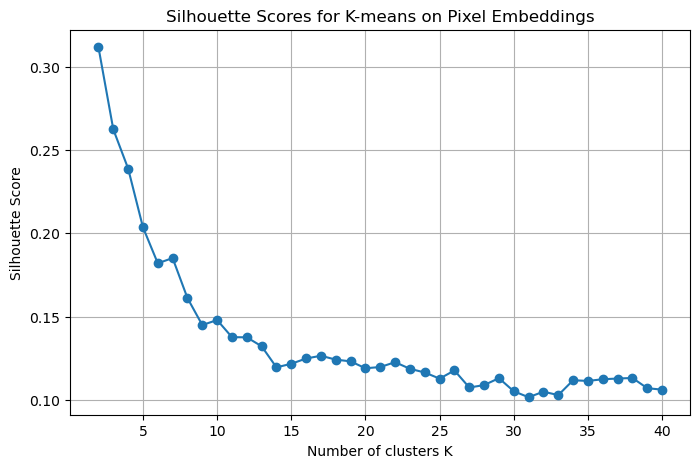


 Best K = 2 with score = 0.3116


In [8]:
# Ks: the range of cluster numbers
Ks = range(2, 41)
sil_scores = []

for k in Ks:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(pixel_pcs)
    score = silhouette_score(pixel_pcs, labels)
    sil_scores.append(score)
    print(f"K={k}, silhouette={score:.4f}")

import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(Ks, sil_scores, marker='o')
plt.xlabel("Number of clusters K")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for K-means on Pixel Embeddings")
plt.grid(True)
plt.show()

best_k = list(Ks)[np.argmax(sil_scores)]
best_score = max(sil_scores)
print(f"\n Best K = {best_k} with score = {best_score:.4f}")

## Carrying out K means for Pixel Space based on number of subfolders

In [9]:
# This dataset has 45 subfolders categorizing the data. We choose k to be the number of subfolders.

best_k_pixel = 45

# Train k-means on Pixel embeddings.
kmeans_pixel = KMeans(n_clusters=best_k_clip, random_state=0)
pixel_clusters = kmeans_pixel.fit_predict(pixel_pcs)

#note from Naomi on 12/9: the line pixel_clusters = kmeans_clip.fit_predict(pixel_pcs) incorrectly fit kmeans_clip with pixel data. replaced with kmeans_pixel above

## Display Cluster Samples

In [10]:
# We would like to see how the pattern images were grouped differently.
# To do this we define a function which lets us display "n" number of images from a cluster of or choice.
# We refer to a cluster by its number. 
def show_cluster_samples(image_paths, labels, cluster_id, n=28):
    
    idx = [i for i in range(len(labels)) if labels[i] == cluster_id] # Get the indexes of images in a cluster. 
    # Here label is the cluster number assigned to an image. 
    # cluster_id is the cluster we want to look into. 
    # This works because CLIP embeddings retain the original ordering of images. So we can correlate this to the original images. 
    
    if len(idx) == 0: 
        print("cluster empty") # If we try to check a cluster that doesn't exist.
        return
    
    sample = random.sample(idx, min(n, len(idx))) # Randomly selecting indexes of images in a cluster.

    # Set style specifics for the plot of images. 
    cols = 4  
    rows = (len(sample) + cols - 1) // cols 
    plt.figure(figsize=(10, 10))
    
    for j, i in enumerate(sample):
        img = Image.open(image_paths[i]).convert("RGB")
        ax = plt.subplot(rows, cols, j+1)
        plt.imshow(img) # Display the images. 
        plt.axis("off")
    plt.tight_layout()
    plt.show()

CLIP cluster:


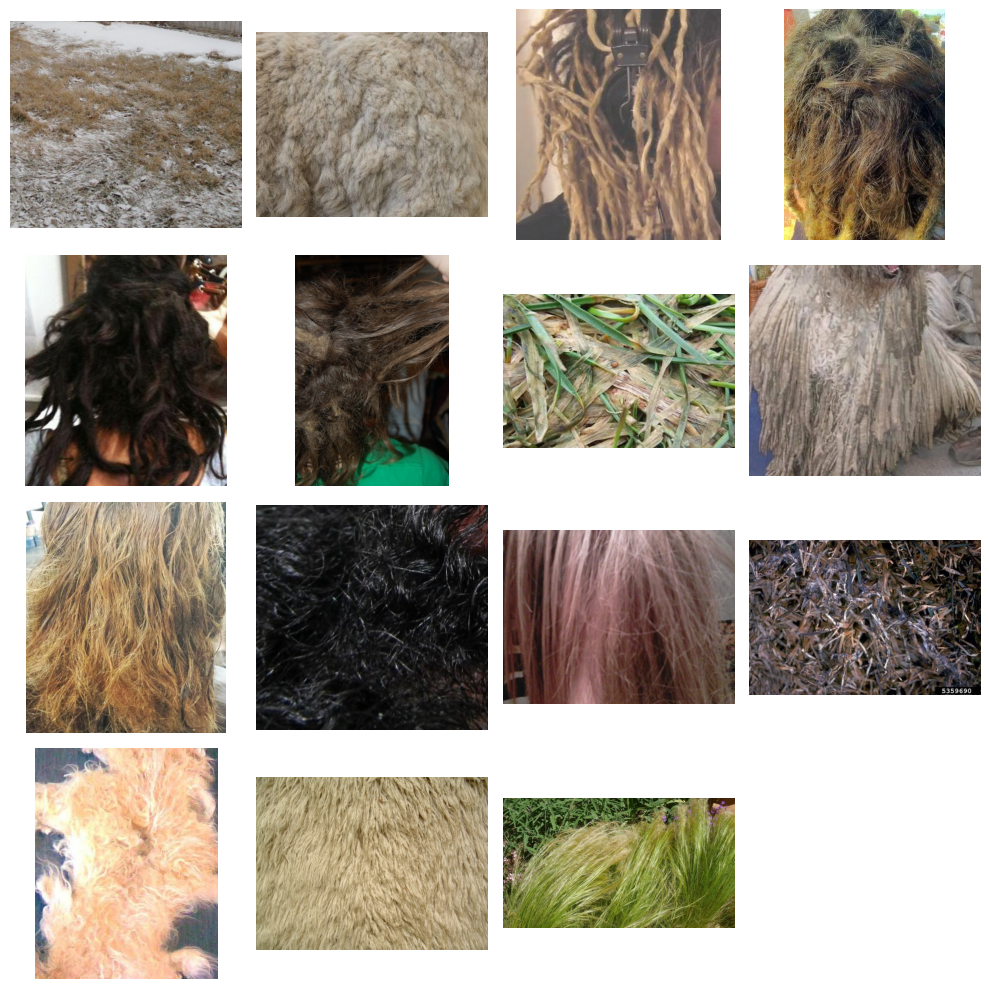

Pixel cluster:


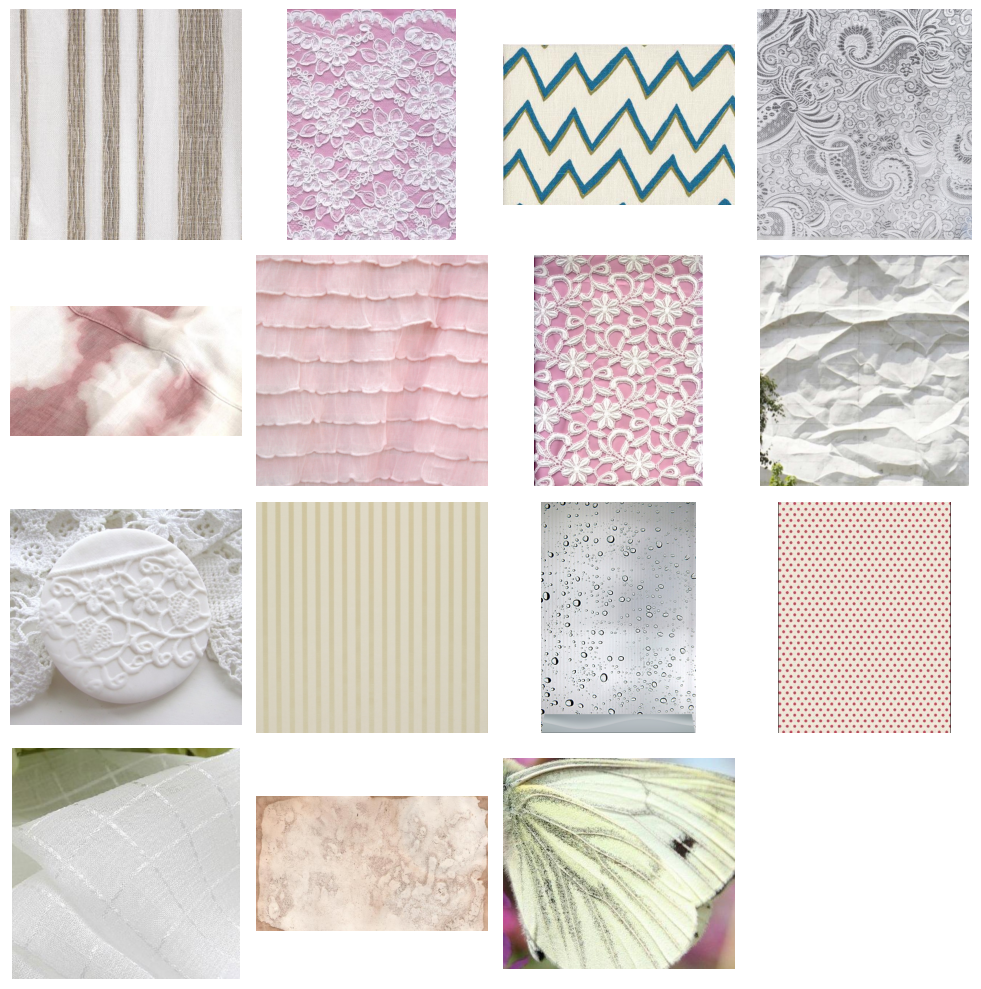

In [11]:
# example clusters
clip_k = 6      # Pick any valid cluster number from clip clusters.
pixel_k = 8    # Pick any valid cluster number from pixel clusters.

print("CLIP cluster:")
show_cluster_samples(patterns, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(patterns, pixel_clusters, pixel_k, n=15)

CLIP cluster:


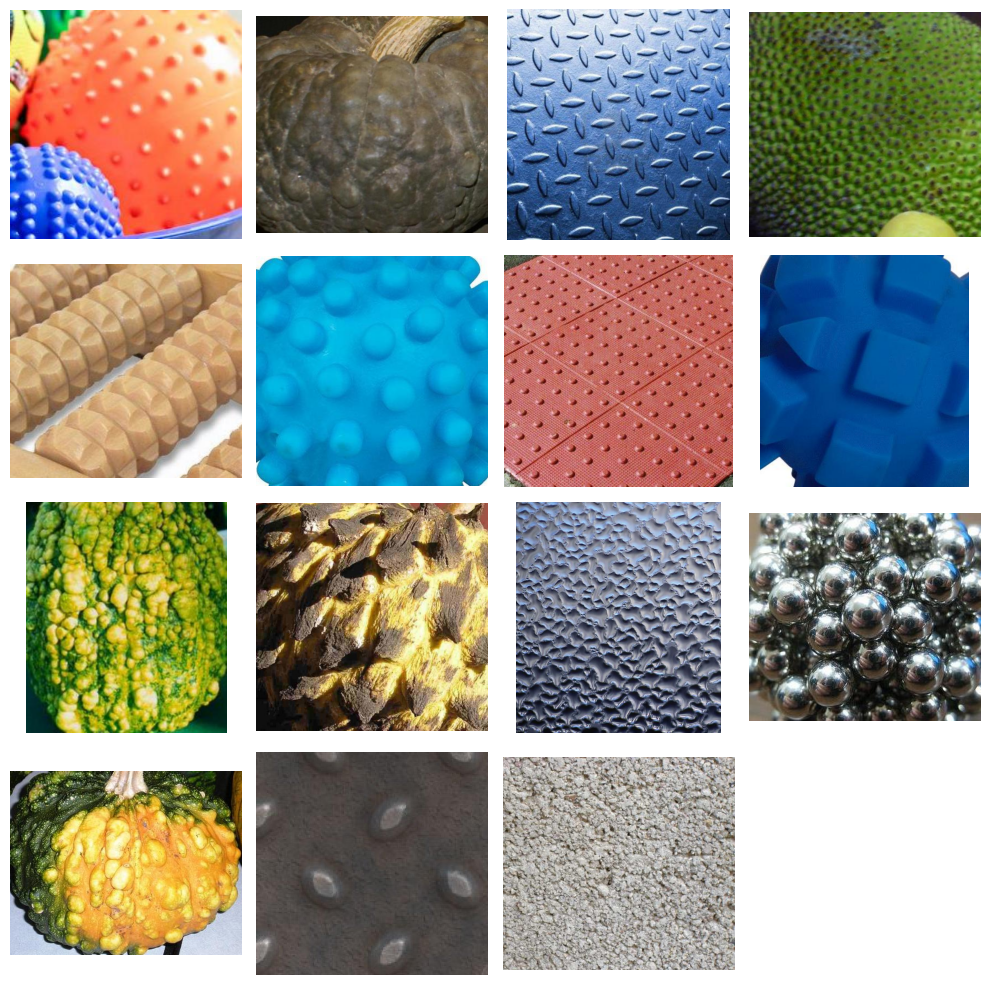

Pixel cluster:


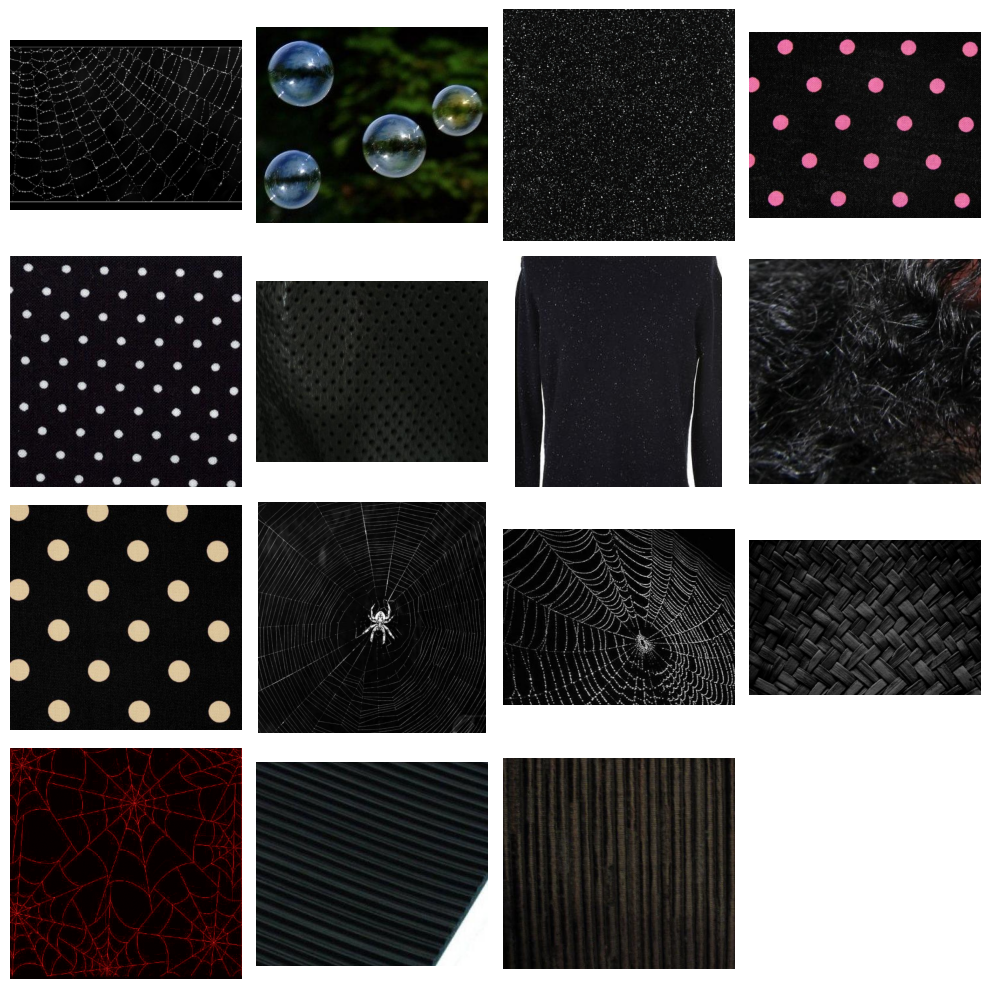

In [12]:
# example clusters
clip_k = 10      # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 9    # Pick any valid cluster number from pixel clusters (1 to 16).

print("CLIP cluster:")
show_cluster_samples(patterns, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(patterns, pixel_clusters, pixel_k, n=15)


CLIP cluster:


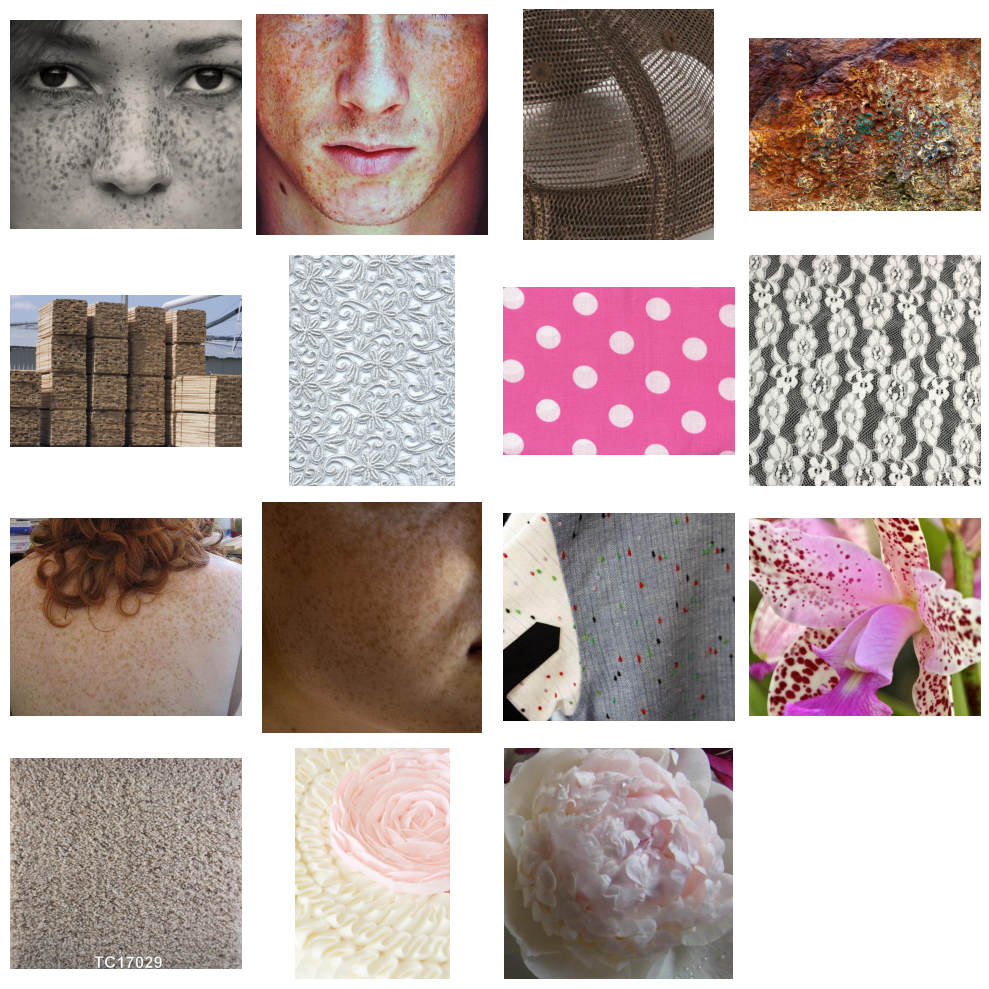

Pixel cluster:


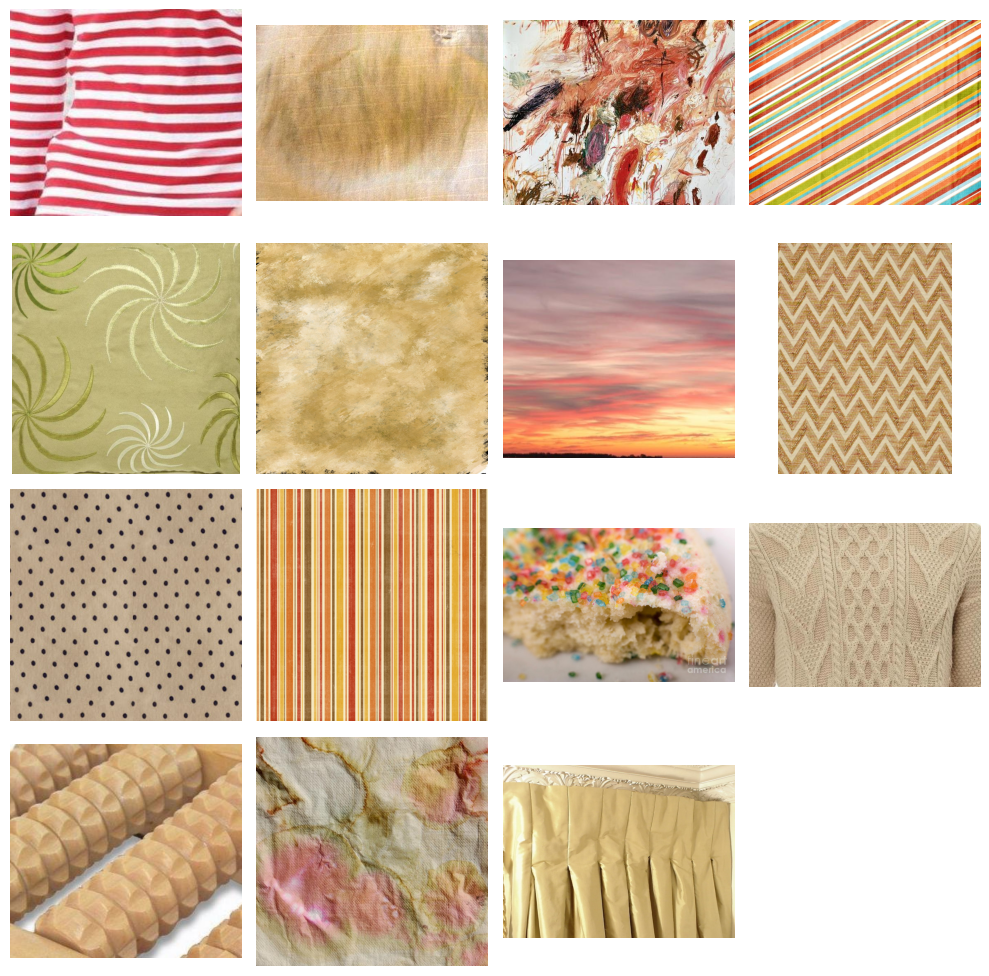

In [13]:
# example clusters
clip_k = 5      # Pick any valid cluster number from clip clusters.
pixel_k = 7    # Pick any valid cluster number from pixel clusters.

print("CLIP cluster:")
show_cluster_samples(patterns, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(patterns, pixel_clusters, pixel_k, n=15)


CLIP cluster:


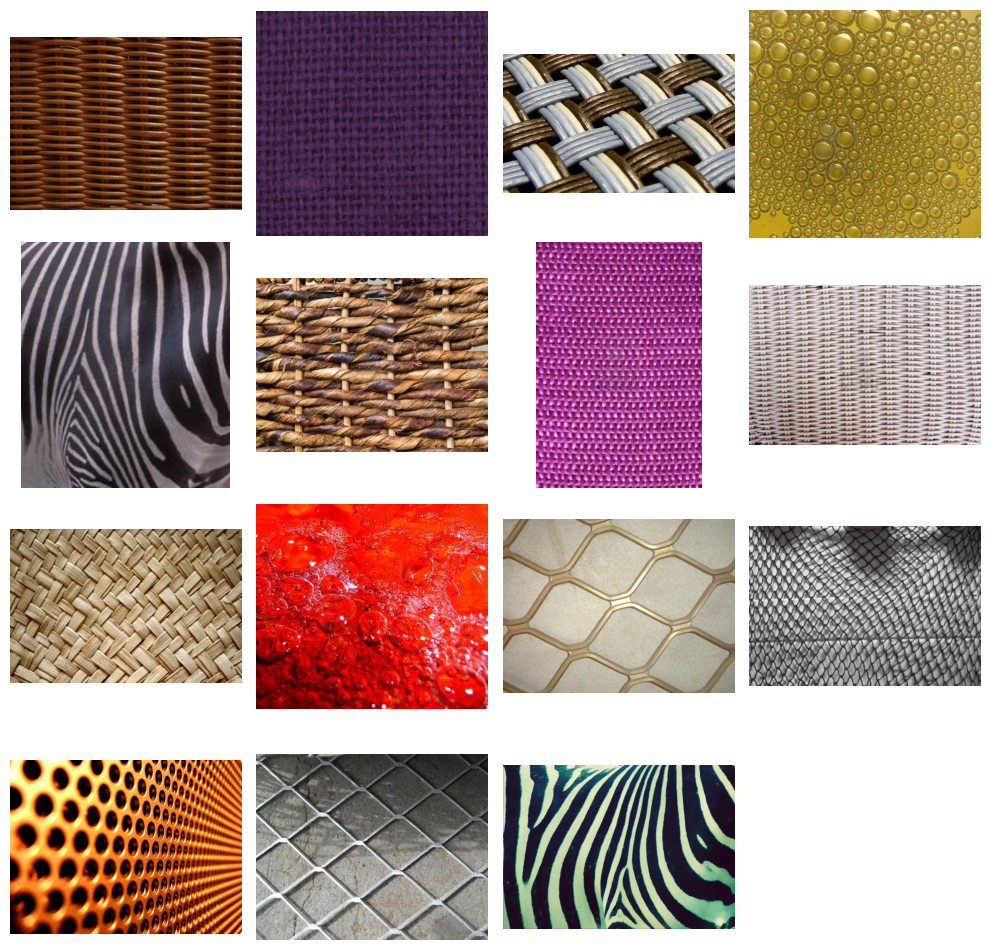

Pixel cluster:


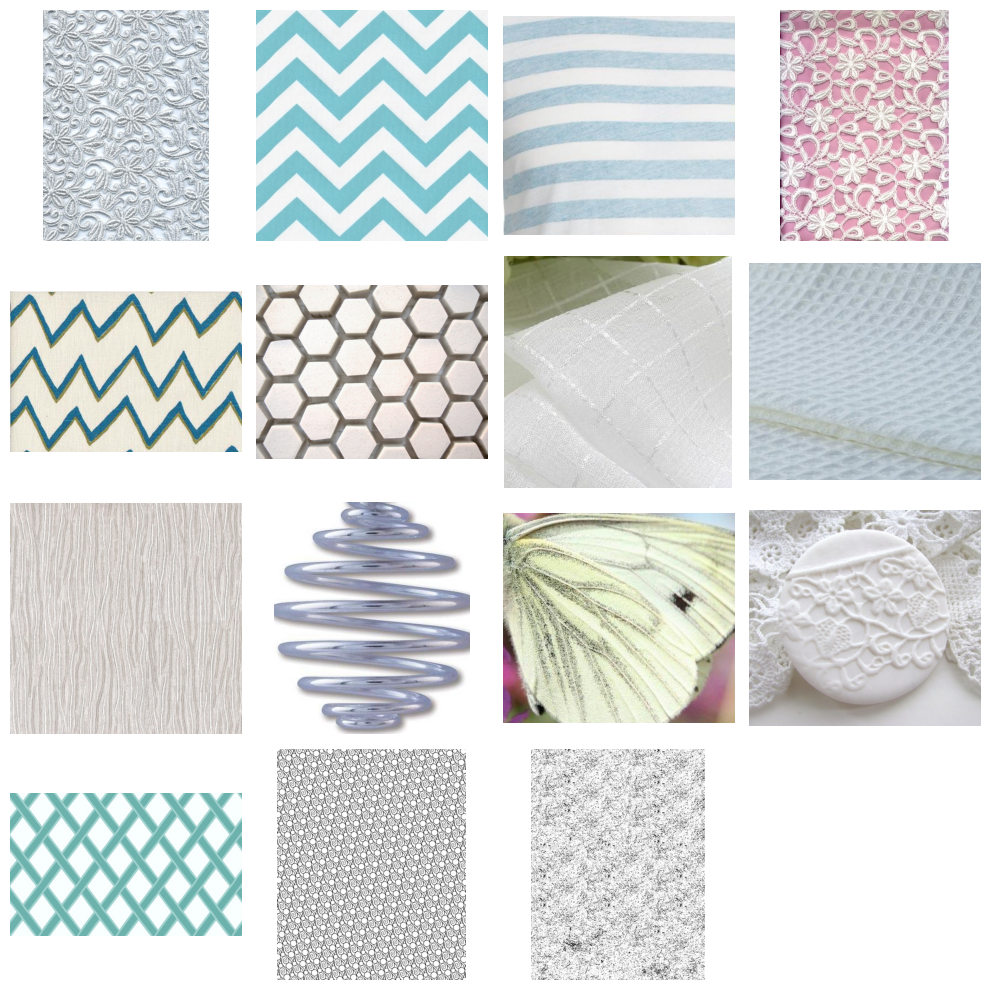

In [14]:
# example clusters
clip_k = 19     # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 8    # Pick any valid cluster number from pixel clusters (1 to 20).

print("CLIP cluster:")
show_cluster_samples(patterns, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(patterns, pixel_clusters, pixel_k, n=15)


CLIP cluster:


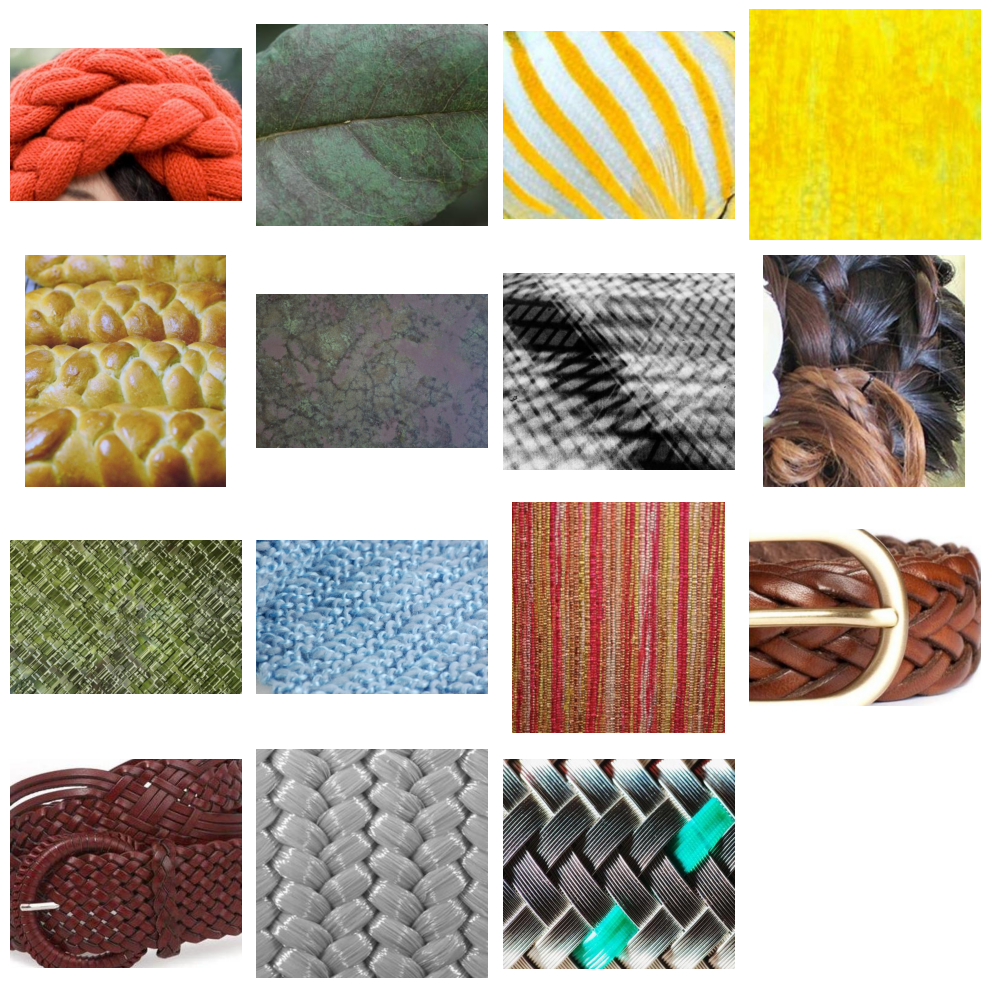

Pixel cluster:


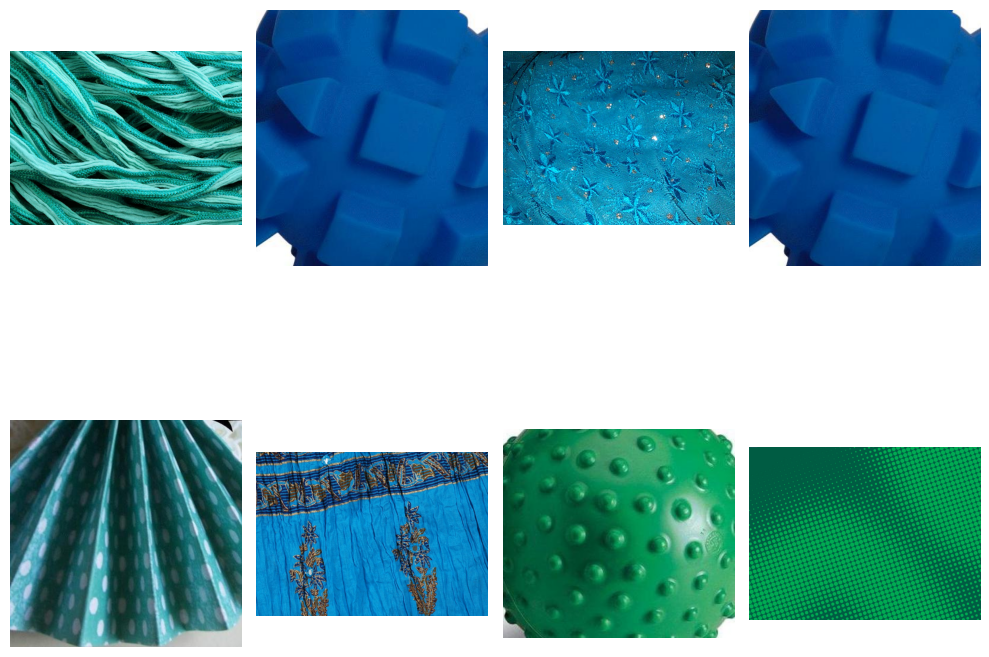

In [15]:
# example clusters
clip_k = 18    # Pick any valid cluster number from clip clusters (1 to 20).
pixel_k = 16   # Pick any valid cluster number from pixel clusters (1 to 20).

print("CLIP cluster:")
show_cluster_samples(patterns, clip_clusters, clip_k, n=15)

print("Pixel cluster:")
show_cluster_samples(patterns, pixel_clusters, pixel_k, n=15)


## Display mean image of each cluster in both spaces

In [16]:
#Using starter code to set up StableUnCLIP
#the same way as in the PCAperturbation notebooks

In [17]:
import requests
import torch
print(f"Memory allocated: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB")
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
import numpy as np
from tqdm import tqdm
import pandas as pd
import numpy as np
import os
from sklearn.decomposition import PCA
import matplotlib.gridspec as gridspec

from diffusers import StableUnCLIPImg2ImgPipeline
from transformers import CLIPTextModelWithProjection, CLIPTokenizer

Memory allocated: 0.00 GB


2025-12-09 08:05:23.221341: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-09 08:05:23.221398: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-09 08:05:23.222677: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-09 08:05:23.228944: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [18]:
tqdm._instances.clear()

In [19]:
# Code for when GPU throws OOM error
torch.cuda.empty_cache()

try:
    del pipe
except:
    pass

try:
    del recon_pipe
except:
    pass

# Check whats left -- should see 0
print(f"Memory allocated: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB")
print(f"Memory reserved: {torch.cuda.memory_reserved(0) / 1e9:.2f} GB")

Memory allocated: 0.00 GB
Memory reserved: 0.00 GB


In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [21]:
recon_pipe = StableUnCLIPImg2ImgPipeline.from_pretrained(
    "sd2-community/stable-diffusion-2-1-unclip", torch_dtype=torch.float32
)

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

In [22]:
recon_pipe = recon_pipe.to("cuda")

In [23]:
def reconstruct_image_from_embedding(recon_pipe, embedding):
    emb_tensor = torch.from_numpy(embedding).unsqueeze(0).to(
        device=recon_pipe.device, 
        dtype=recon_pipe.image_encoder.dtype
    )
    return recon_pipe(image_embeds=emb_tensor).images[0]

## Reconstruct the images from the embeddings at the center of each cluster

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

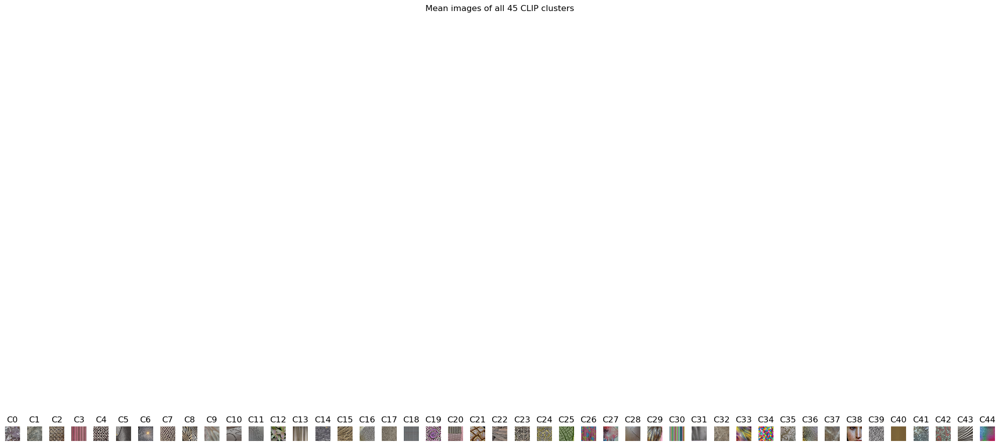

In [34]:
#CLIP space
clipcentroids = kmeans_clip.cluster_centers_

number = len(clipcentroids)
cols = 7
rows = (number + cols - 1) // cols
fig, axes = plt.subplots(1, number), figsize=(20, rows * 2.5))
axes = axes.flatten()

for i, c in enumerate(clipcentroids):
    centroidimg = reconstruct_image_from_embedding(recon_pipe, c)
    axes[i].imshow(centroidimg)
    axes[i].set_title(f'C{i}')
    axes[i].axis('off')

for j in range(number + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Mean images of all 45 CLIP clusters')
plt.tight_layout()
plt.show()

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

KeyboardInterrupt: 

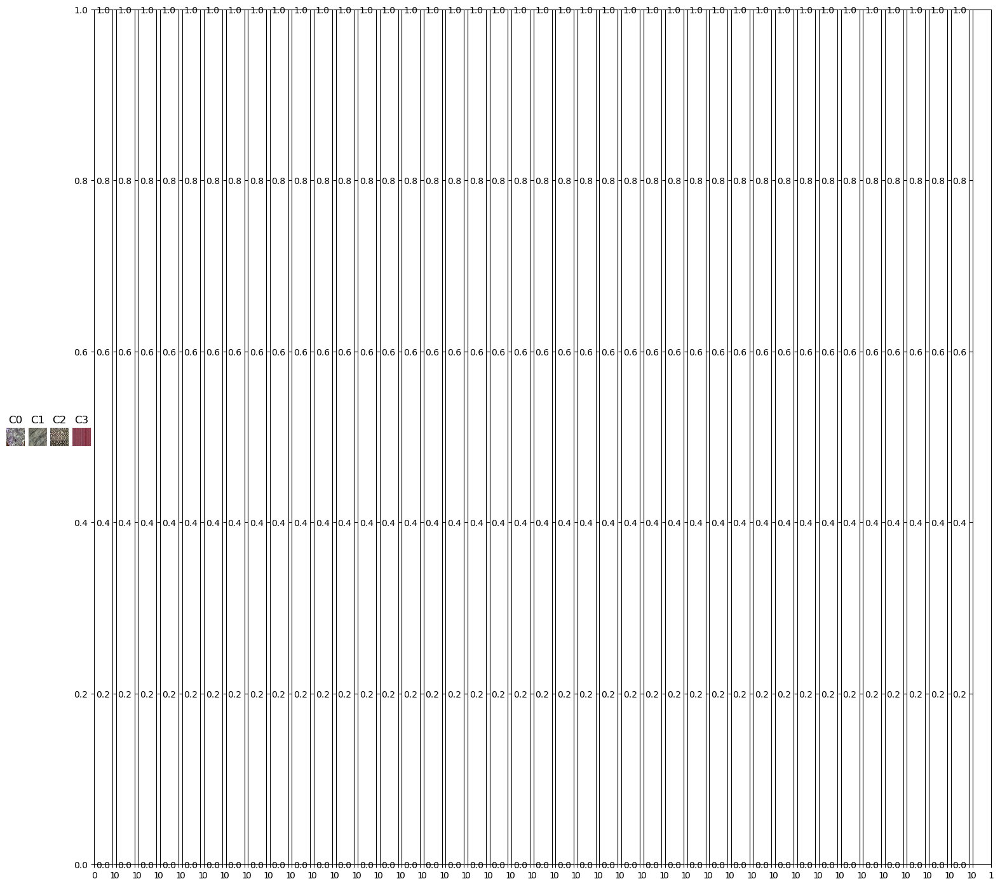

In [35]:
#Pixel space
pixelcentroids = pca_pixels.inverse_transform(kmeans_pixel.cluster_centers_)

number = len(pixelcentroids)
cols = 7
rows = (number + cols - 1) // cols
fig, axes = plt.subplots(1, number, figsize=(20, rows * 2.5))
axes = axes.flatten()

for i, c in enumerate(clipcentroids):
    centroidimg = reconstruct_image_from_embedding(recon_pipe, c)
    axes[i].imshow(centroidimg)
    axes[i].set_title(f'C{i}')
    axes[i].axis('off')

for j in range(number + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Mean images of all 45 Pixel clusters')
plt.tight_layout()
plt.show()

## Observations

The CLIP-based clusters tend to group together textures and surfaces that share a similar material or structural identity, such as layered rock formations, organic growth patterns, woven or fibrous surfaces, and regularly patterned materials like meshes or scales. These groupings often include a mix of colors and contexts, but still feel visually and conceptually coherent because they reflect recognizable types of natural or manufactured textures. In contrast, the pixel-based clusters appear to be driven primarily by shared visual qualities such as darkness or lightness, overall color tone, and the density of small, repeated marks. As a result, surfaces like hair, grass, fabric, and rough ground are sometimes grouped together simply because they share similar visual densities or color profiles, even though they are semantically unrelated. Overall, the CLIP clusters emphasize material and structural similarity, while the pixel clusters emphasize purely visual resemblance at the surface level.